In [21]:
import numpy as np
import time, os, sys

import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
import omero

%matplotlib inline
mpl.rcParams['figure.dpi'] = 100
mpl.rcParams['figure.figsize'] = (10, 10)

from cellpose import utils
from cellpose import models

from omero_utils.widgets import OMEConnect
from omero_utils.imageio import OmeroImageReader

os.environ["MXNET_USE_FUSION"] = "0"
m = OMEConnect(host="139.124.86.50")

m

OMEConnect(children=(Text(value='', description='OME loggin'), Password(description='OME password'), Button(de…

In [22]:
reader = OmeroImageReader(18652, m.conn)


Treating 18652
No objective found


In [23]:
reader.metadata

{'SizeZ': 24,
 'SizeC': 4,
 'SizeT': 1,
 'Id': 18652,
 'AquisitionDate': None,
 'PhysicalSizeX': 0.20756646174321788,
 'ChannelLabels': ['0', '1', '2', '3'],
 'LensNA': nan,
 'nominalMagnification': nan}

In [24]:
imgs = [reader.get_plane(0, z, 0) for z in range(reader.metadata['SizeZ'])]

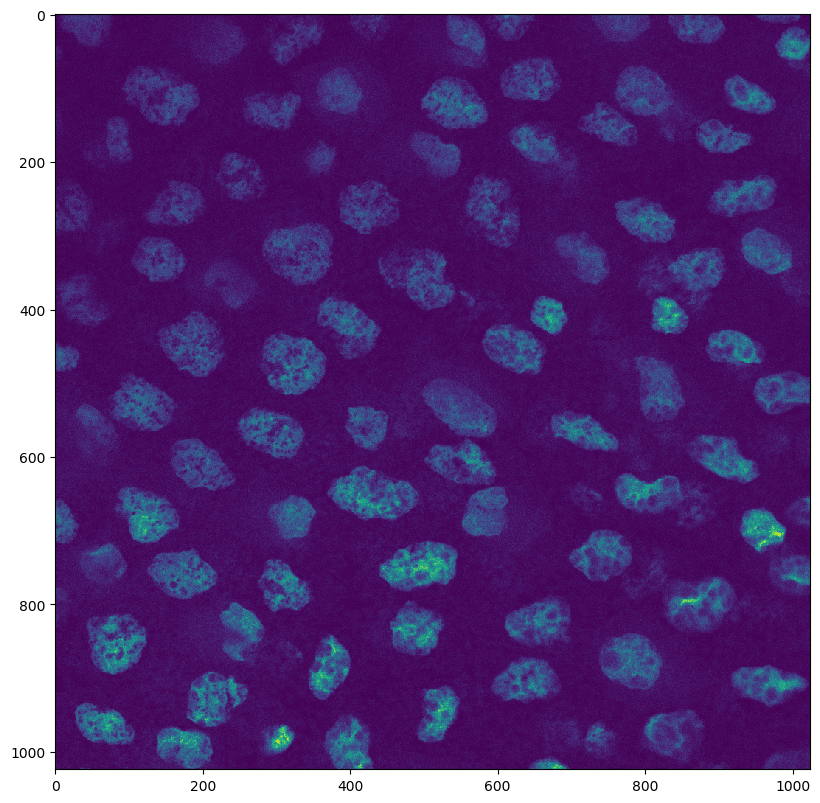

In [25]:
fig, ax = plt.subplots()

ax.imshow(imgs[12])

In [26]:
((330 / 3.14) ** 0.5) * 2

20.503223297937705

In [27]:

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=True, model_type='cyto')

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
channels = [0, 0]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended) 
# diameter can be a list or a single number for all images
masks, flows, styles, diams = model.eval(imgs, diameter=20, channels=channels)

>>>> using GPU
processing 24 image(s)


100%|██████████| 24/24 [05:24<00:00, 13.53s/it]


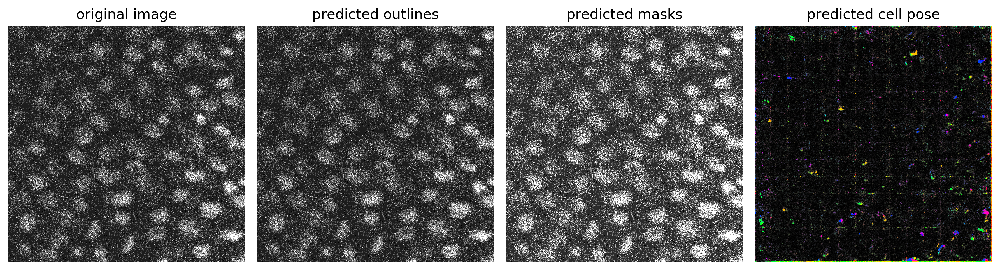

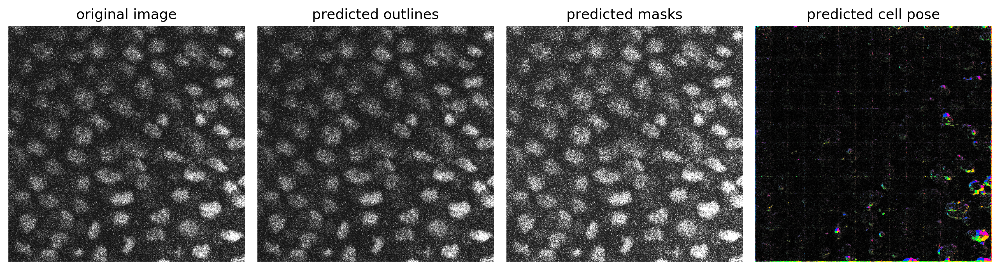

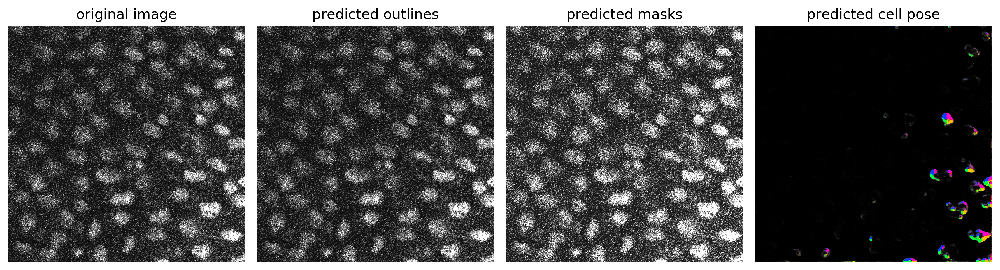

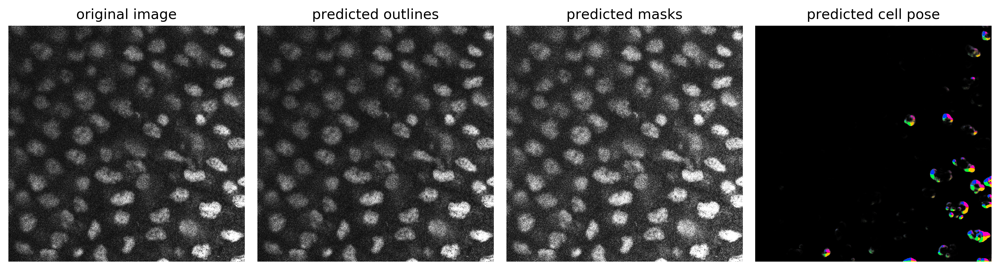

In [20]:
# DISPLAY RESULTS
from cellpose import plot

nimg = len(imgs[10: 14])
for idx in range(nimg):
    maski = masks[idx]
    flowi = flows[idx][0]
    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, imgs[idx], maski, flowi, channels=[0, 0])
    plt.tight_layout()
